In [1]:
!nvidia-smi

Fri Jul 21 09:50:58 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

**Libraries** **to** **install**

In [3]:
!pip install ultralytics

from IPython import display
display.clear_output()
!yolo checks

Ultralytics YOLOv8.0.139 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.3/78.2 GB disk)


In [2]:
from ultralytics import YOLO
from IPython.display import display, Image

# I Annotate my dataset via Roboflow and got the necessary download code for Yolov8 and put it in the cell

In [3]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="****")
project = rf.workspace("school-jjzum").project("ball4-5jlzw")
dataset = project.version(1).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.134 is required but found version=8.0.139, to fix: `pip install ultralytics==8.0.134`


Extracting Dataset Version Zip to ball4-1 in yolov8:: 100%|██████████| 1306/1306 [00:00<00:00, 1412.84it/s]


**drive connection**

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Model training

In [7]:
!yolo task=detect mode=train model=yolov8s.pt data=/content/drive/MyDrive/ball4.v1i.yolov8/data.yaml epochs=50

Ultralytics YOLOv8.0.139 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/ball4.v1i.yolov8/data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, i

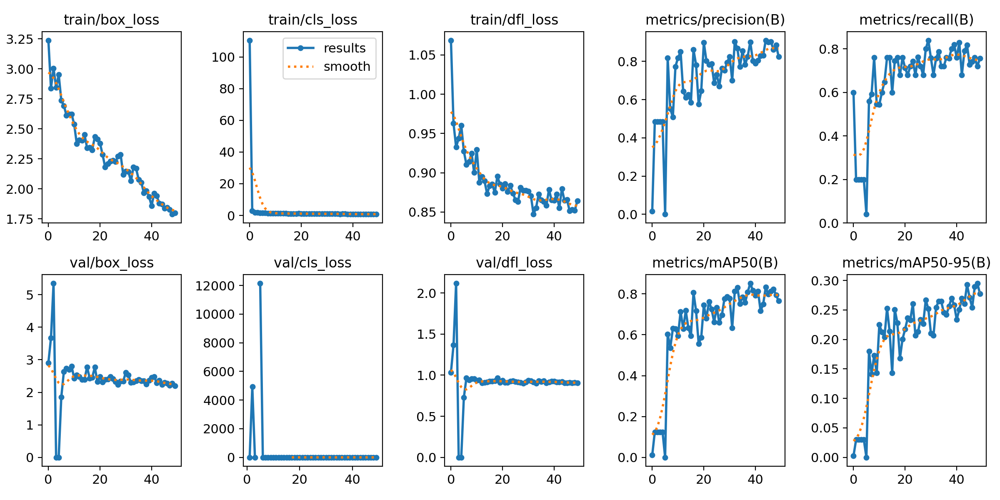

In [8]:
Image(filename=f'/content/runs/detect/train3/results.png')

Conf value: means show those with confidence threshold higher than 0.5
It will detect the balls in our test set and return the results by filtering them with the specified reliability threshold.

In [9]:
!yolo task=detect mode=predict model=/content/runs/detect/train3/weights/best.pt conf=0.5 source=/content/ball4-1/test/images save=True

Ultralytics YOLOv8.0.139 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients

image 1/25 /content/ball4-1/test/images/109_jpg.rf.0490dfb557a76f0be6592250a7deec26.jpg: 416x640 (no detections), 110.9ms
image 2/25 /content/ball4-1/test/images/116_jpg.rf.701d6c36c5a046ded499eafc96b6c4eb.jpg: 416x640 1 Ball, 12.7ms
image 3/25 /content/ball4-1/test/images/119_jpg.rf.fccf13df7172565fb3824f43d847abcd.jpg: 416x640 1 Ball, 12.7ms
image 4/25 /content/ball4-1/test/images/144_jpg.rf.3f7153160d2893ab05750226a7061798.jpg: 416x640 (no detections), 12.7ms
image 5/25 /content/ball4-1/test/images/149_jpg.rf.46aa2a51999c4928207755af6400e5fe.jpg: 416x640 1 Ball, 12.8ms
image 6/25 /content/ball4-1/test/images/150_jpg.rf.35822867f5877a264f67b94770bfe982.jpg: 416x640 (no detections), 15.2ms
image 7/25 /content/ball4-1/test/images/159_jpg.rf.3b01cd15da2e67633d59e814c67c347d.jpg: 416x640 1 Ball, 12.7ms
image 8/25 /content/ball4-1/test

In [10]:
!yolo task=detect mode=predict model=/content/runs/detect/train3/weights/best.pt conf=0.3 source=/content/ball4-1/test/images save=True

Ultralytics YOLOv8.0.139 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients

image 1/25 /content/ball4-1/test/images/109_jpg.rf.0490dfb557a76f0be6592250a7deec26.jpg: 416x640 1 Ball, 107.8ms
image 2/25 /content/ball4-1/test/images/116_jpg.rf.701d6c36c5a046ded499eafc96b6c4eb.jpg: 416x640 1 Ball, 12.7ms
image 3/25 /content/ball4-1/test/images/119_jpg.rf.fccf13df7172565fb3824f43d847abcd.jpg: 416x640 1 Ball, 12.7ms
image 4/25 /content/ball4-1/test/images/144_jpg.rf.3f7153160d2893ab05750226a7061798.jpg: 416x640 (no detections), 12.6ms
image 5/25 /content/ball4-1/test/images/149_jpg.rf.46aa2a51999c4928207755af6400e5fe.jpg: 416x640 1 Ball, 12.7ms
image 6/25 /content/ball4-1/test/images/150_jpg.rf.35822867f5877a264f67b94770bfe982.jpg: 416x640 (no detections), 12.7ms
image 7/25 /content/ball4-1/test/images/159_jpg.rf.3b01cd15da2e67633d59e814c67c347d.jpg: 416x640 1 Ball, 13.0ms
image 8/25 /content/ball4-1/test/images/1

**New model training by increasing the epochs value**

In [13]:
!yolo task=detect mode=train model=yolov8s.pt data=/content/drive/MyDrive/ball4.v1i.yolov8/data.yaml epochs=70

Ultralytics YOLOv8.0.139 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/ball4.v1i.yolov8/data.yaml, epochs=70, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, i

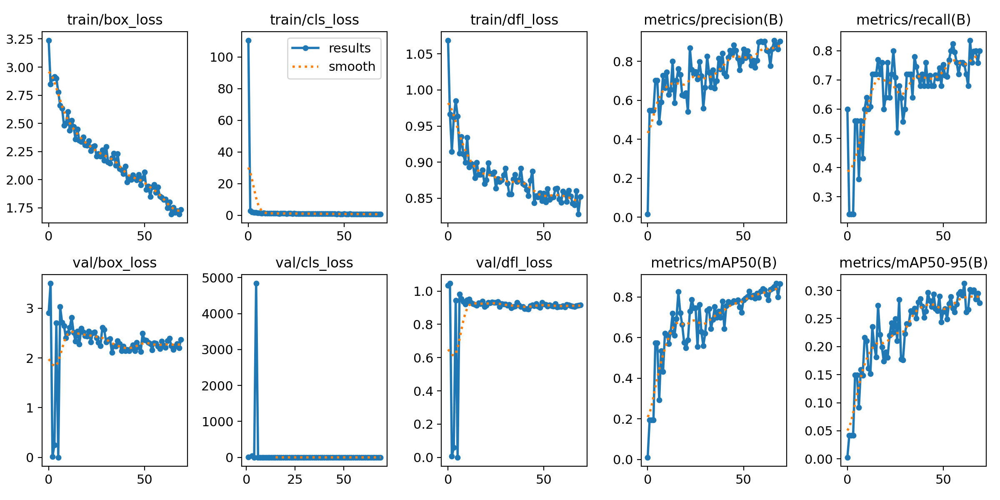

In [14]:
Image(filename=f'/content/runs/detect/train4/results.png')

In [15]:
!yolo task=detect mode=predict model=/content/runs/detect/train4/weights/best.pt conf=0.5 source=/content/ball4-1/test/images save=True

Ultralytics YOLOv8.0.139 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients

image 1/25 /content/ball4-1/test/images/109_jpg.rf.0490dfb557a76f0be6592250a7deec26.jpg: 416x640 (no detections), 108.5ms
image 2/25 /content/ball4-1/test/images/116_jpg.rf.701d6c36c5a046ded499eafc96b6c4eb.jpg: 416x640 1 Ball, 12.7ms
image 3/25 /content/ball4-1/test/images/119_jpg.rf.fccf13df7172565fb3824f43d847abcd.jpg: 416x640 1 Ball, 12.7ms
image 4/25 /content/ball4-1/test/images/144_jpg.rf.3f7153160d2893ab05750226a7061798.jpg: 416x640 (no detections), 12.7ms
image 5/25 /content/ball4-1/test/images/149_jpg.rf.46aa2a51999c4928207755af6400e5fe.jpg: 416x640 1 Ball, 12.7ms
image 6/25 /content/ball4-1/test/images/150_jpg.rf.35822867f5877a264f67b94770bfe982.jpg: 416x640 (no detections), 12.7ms
image 7/25 /content/ball4-1/test/images/159_jpg.rf.3b01cd15da2e67633d59e814c67c347d.jpg: 416x640 1 Ball, 12.7ms
image 8/25 /content/ball4-1/test

In [16]:
!yolo task=detect mode=predict model=/content/runs/detect/train4/weights/best.pt conf=0.3 source=/content/ball4-1/test/images save=True

Ultralytics YOLOv8.0.139 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients

image 1/25 /content/ball4-1/test/images/109_jpg.rf.0490dfb557a76f0be6592250a7deec26.jpg: 416x640 (no detections), 104.2ms
image 2/25 /content/ball4-1/test/images/116_jpg.rf.701d6c36c5a046ded499eafc96b6c4eb.jpg: 416x640 1 Ball, 12.7ms
image 3/25 /content/ball4-1/test/images/119_jpg.rf.fccf13df7172565fb3824f43d847abcd.jpg: 416x640 1 Ball, 12.7ms
image 4/25 /content/ball4-1/test/images/144_jpg.rf.3f7153160d2893ab05750226a7061798.jpg: 416x640 (no detections), 12.7ms
image 5/25 /content/ball4-1/test/images/149_jpg.rf.46aa2a51999c4928207755af6400e5fe.jpg: 416x640 1 Ball, 12.7ms
image 6/25 /content/ball4-1/test/images/150_jpg.rf.35822867f5877a264f67b94770bfe982.jpg: 416x640 1 Ball, 12.6ms
image 7/25 /content/ball4-1/test/images/159_jpg.rf.3b01cd15da2e67633d59e814c67c347d.jpg: 416x640 1 Ball, 12.7ms
image 8/25 /content/ball4-1/test/images/1

**New model training**

In [17]:
!yolo task=detect mode=train model=yolov8s.pt data=/content/drive/MyDrive/ball4.v1i.yolov8/data.yaml epochs=50 imgsz=800

Ultralytics YOLOv8.0.139 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/ball4.v1i.yolov8/data.yaml, epochs=50, patience=50, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, i

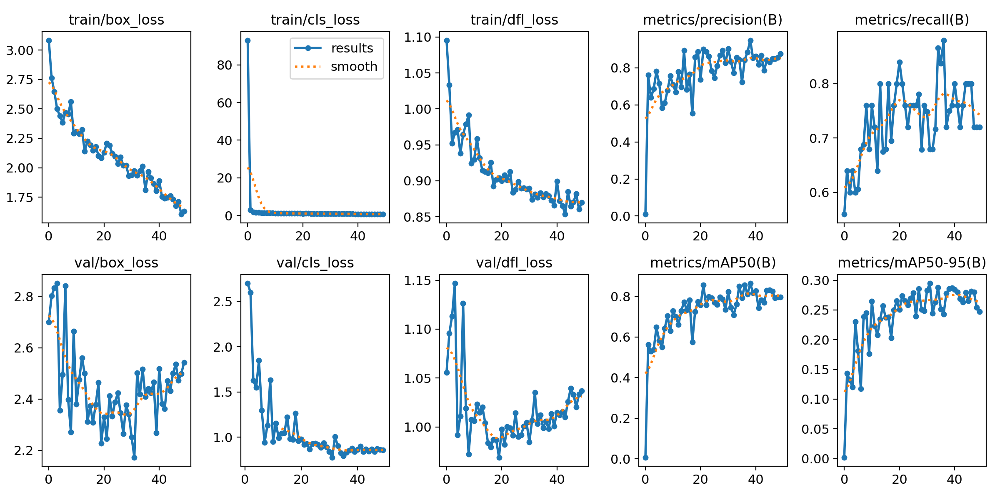

In [18]:
Image(filename=f'/content/runs/detect/train5/results.png')

In [19]:
!yolo task=detect mode=predict model=/content/runs/detect/train5/weights/best.pt conf=0.5 source=/content/ball4-1/test/images save=True

Ultralytics YOLOv8.0.139 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients

image 1/25 /content/ball4-1/test/images/109_jpg.rf.0490dfb557a76f0be6592250a7deec26.jpg: 512x800 (no detections), 101.3ms
image 2/25 /content/ball4-1/test/images/116_jpg.rf.701d6c36c5a046ded499eafc96b6c4eb.jpg: 512x800 1 Ball, 15.8ms
image 3/25 /content/ball4-1/test/images/119_jpg.rf.fccf13df7172565fb3824f43d847abcd.jpg: 512x800 1 Ball, 15.8ms
image 4/25 /content/ball4-1/test/images/144_jpg.rf.3f7153160d2893ab05750226a7061798.jpg: 512x800 1 Ball, 15.8ms
image 5/25 /content/ball4-1/test/images/149_jpg.rf.46aa2a51999c4928207755af6400e5fe.jpg: 512x800 1 Ball, 15.8ms
image 6/25 /content/ball4-1/test/images/150_jpg.rf.35822867f5877a264f67b94770bfe982.jpg: 512x800 1 Ball, 15.8ms
image 7/25 /content/ball4-1/test/images/159_jpg.rf.3b01cd15da2e67633d59e814c67c347d.jpg: 512x800 1 Ball, 15.9ms
image 8/25 /content/ball4-1/test/images/172_jpg.rf

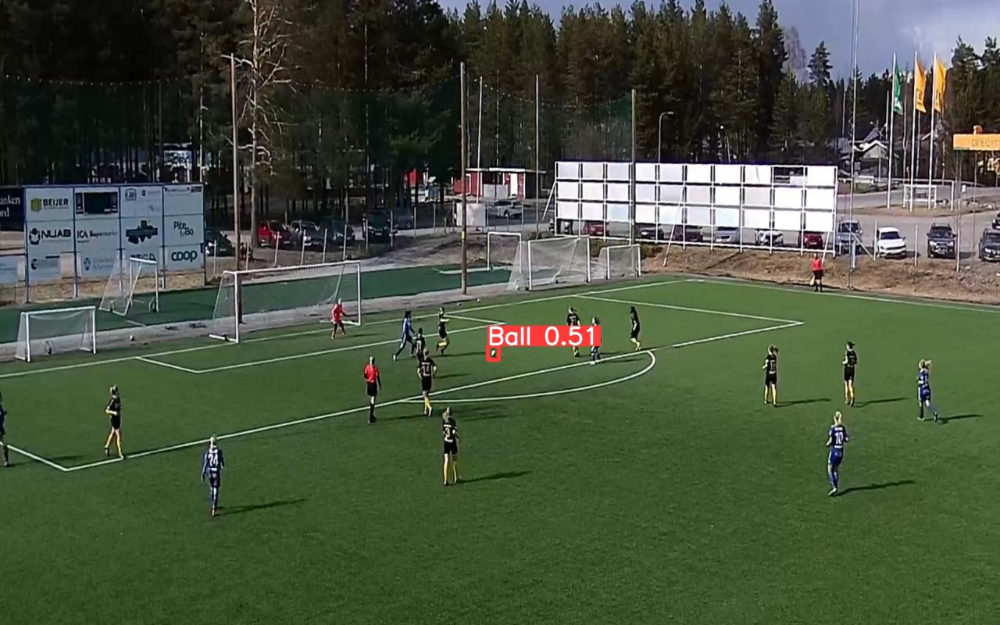

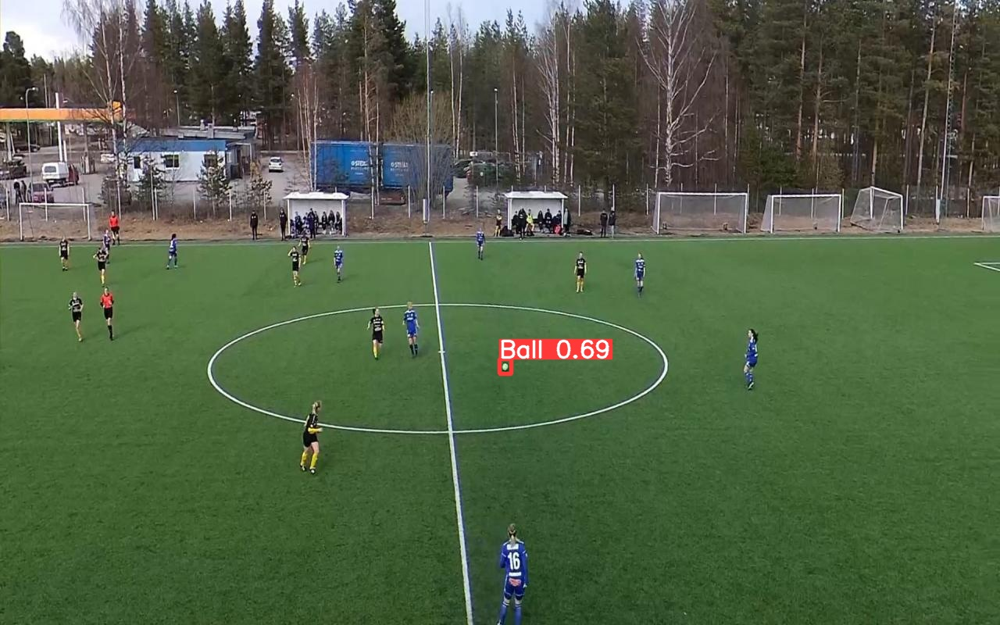

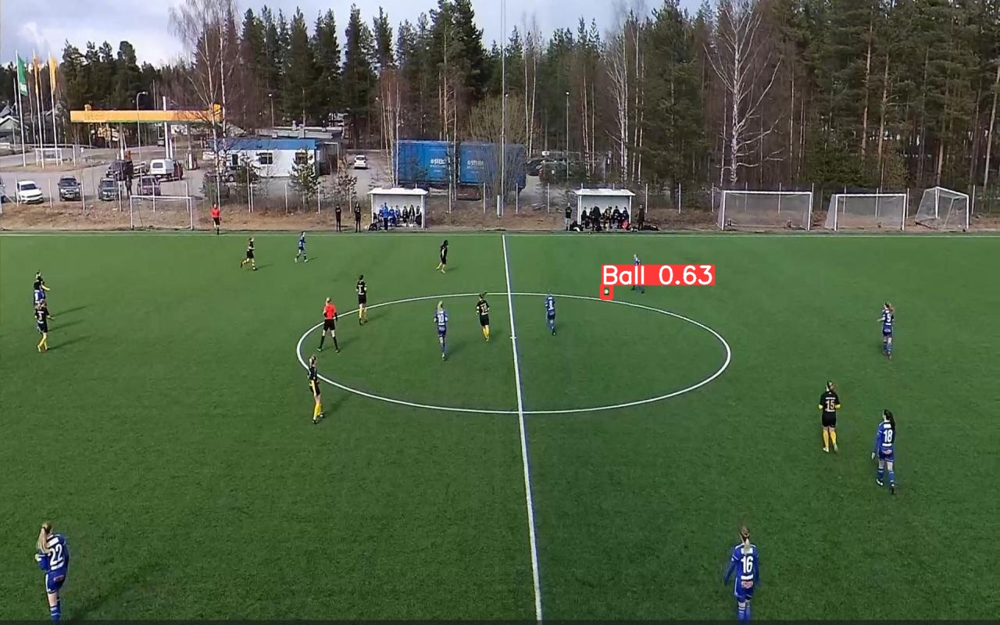

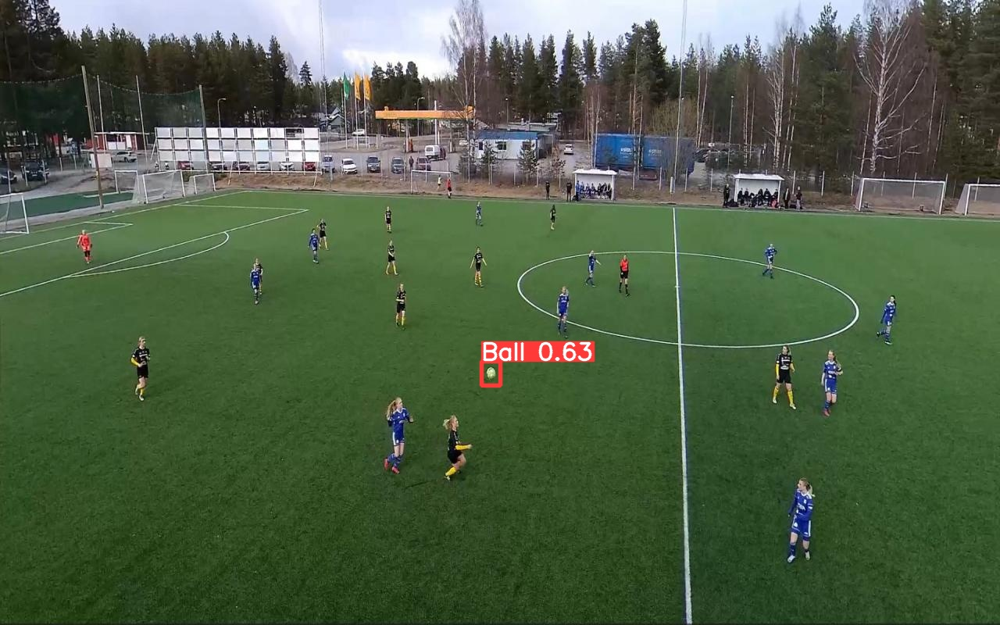

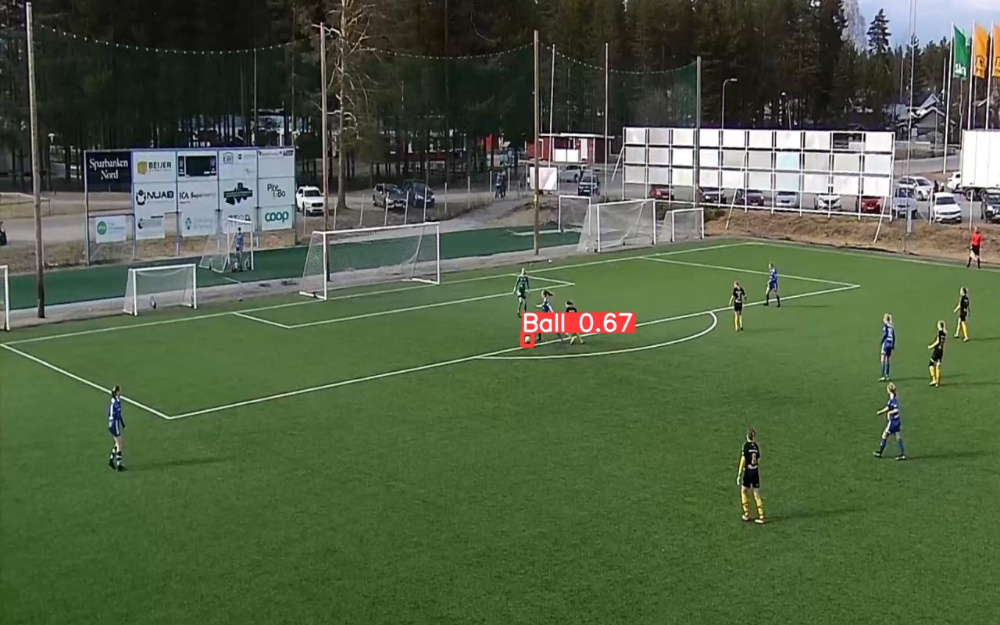

...

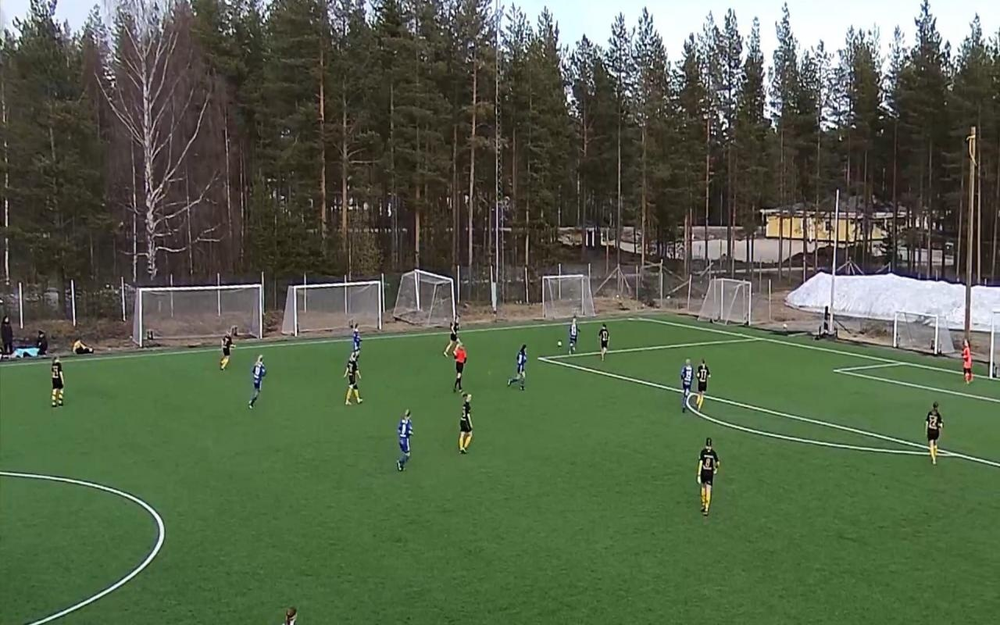

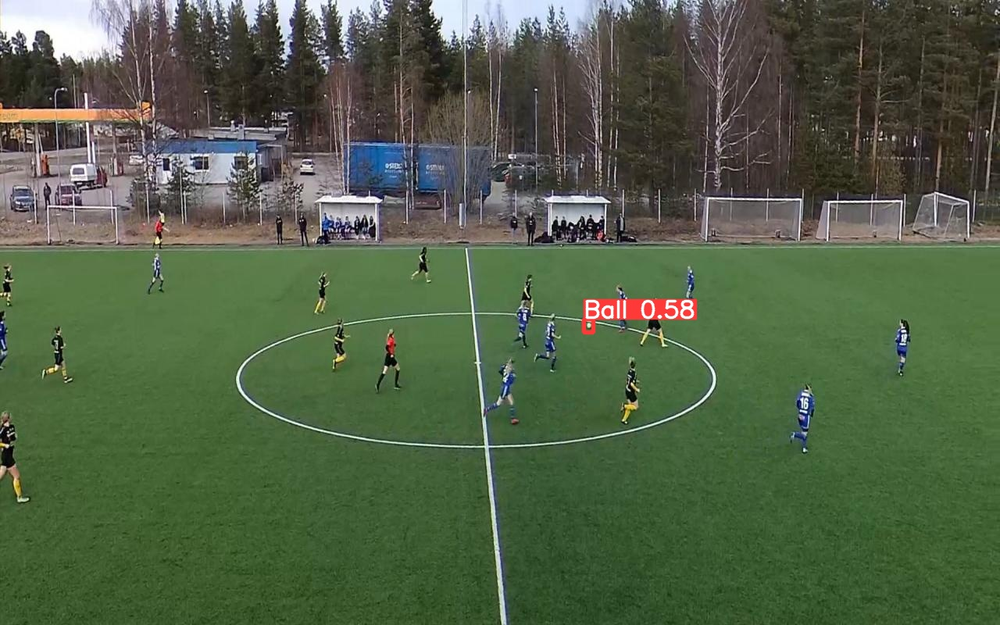

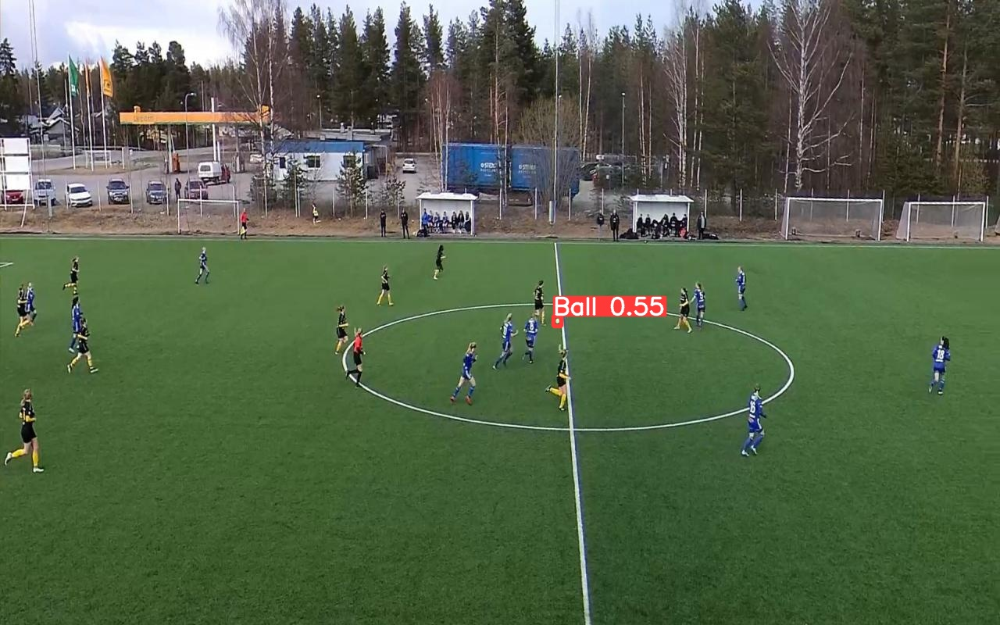

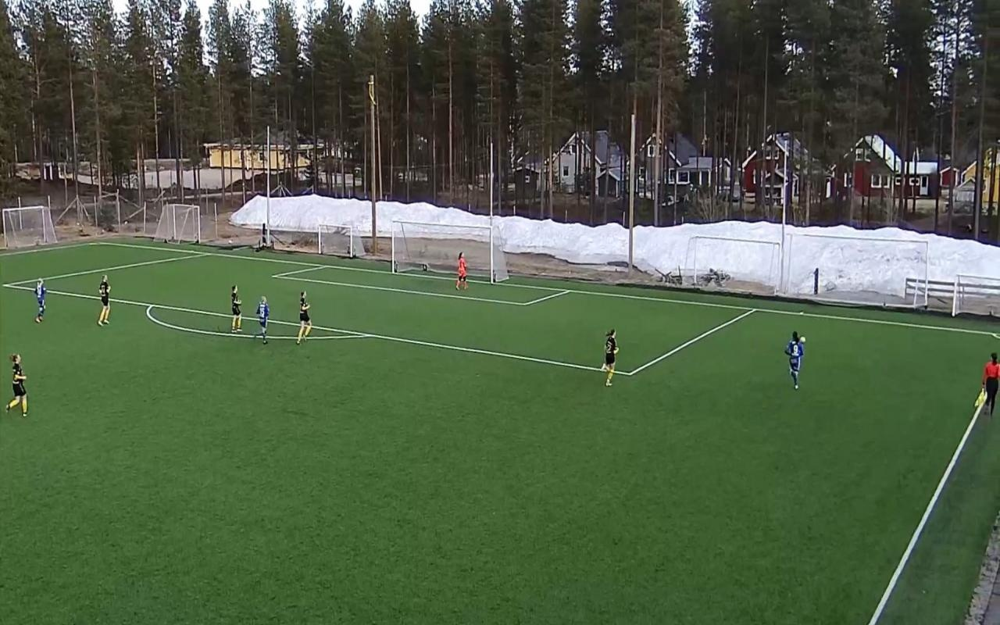

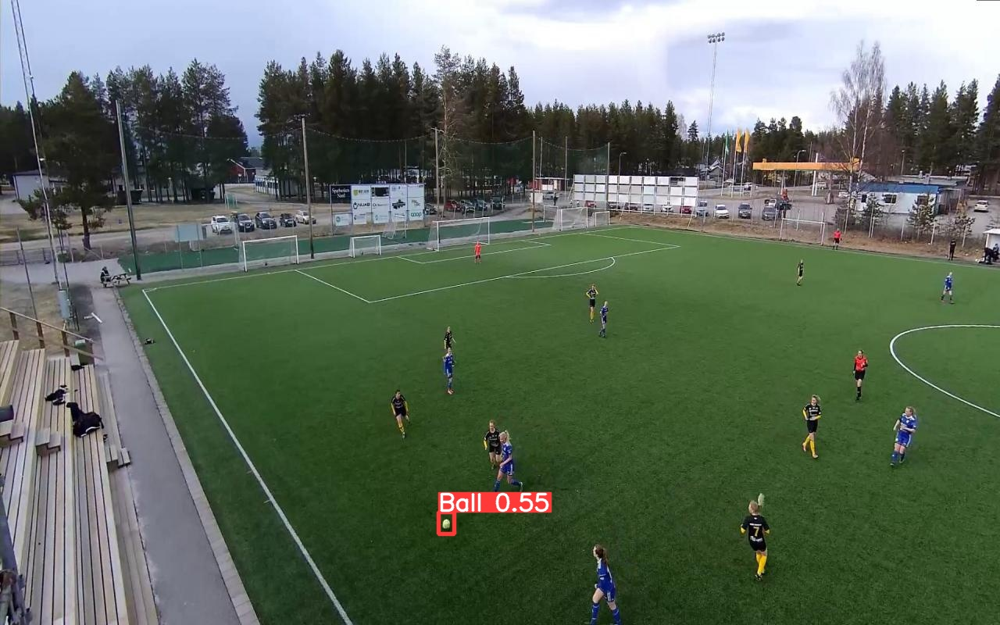

In [21]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/runs/detect/predict7/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")
